In [1]:
import pandas as pd

In [23]:
part_one = pd.read_csv("/Users/cynthia_jiang/Desktop/spotify_youtubu/clean_data.csv")
import plotly.express as px
import numpy as np
import plotly.graph_objects as go
part_one = part_one.copy()
# Make sure log columns exist
part_one["Log_Views"] = np.log1p(part_one["Views"])
part_one["Log_Likes"] = np.log1p(part_one["Likes"])
part_one["Log_Comments"] = np.log1p(part_one["Comments"])
part_one["Log_Stream"] = np.log1p(part_one["Stream"])


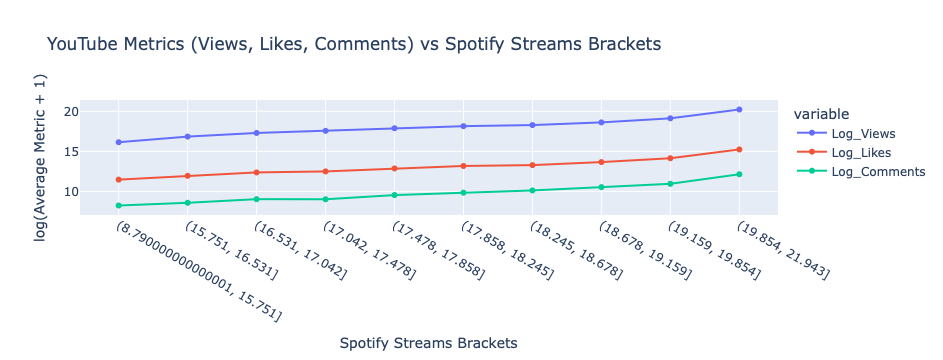

In [10]:
part_one["Stream_bin"] = pd.qcut(part_one["Log_Stream"], q=10)
                           
bracket_avg = part_one.groupby("Stream_bin", observed=True).agg({
    "Views": "mean",
    "Likes": "mean",
    "Comments": "mean"
}).reset_index()

bracket_avg["Stream_bin"] = bracket_avg["Stream_bin"].astype(str) 

bracket_avg["Log_Views"] = np.log1p(bracket_avg["Views"])
bracket_avg["Log_Likes"] = np.log1p(bracket_avg["Likes"])
bracket_avg["Log_Comments"] = np.log1p(bracket_avg["Comments"])


fig = px.line(
    bracket_avg,
    x="Stream_bin",
    y=["Log_Views", "Log_Likes", "Log_Comments"],
    markers=True,
    title="YouTube Metrics (Views, Likes, Comments) vs Spotify Streams Brackets",
    labels={"value": "log(Average Metric + 1)", "Stream_bin": "Spotify Streams Brackets"}
)
fig.show()

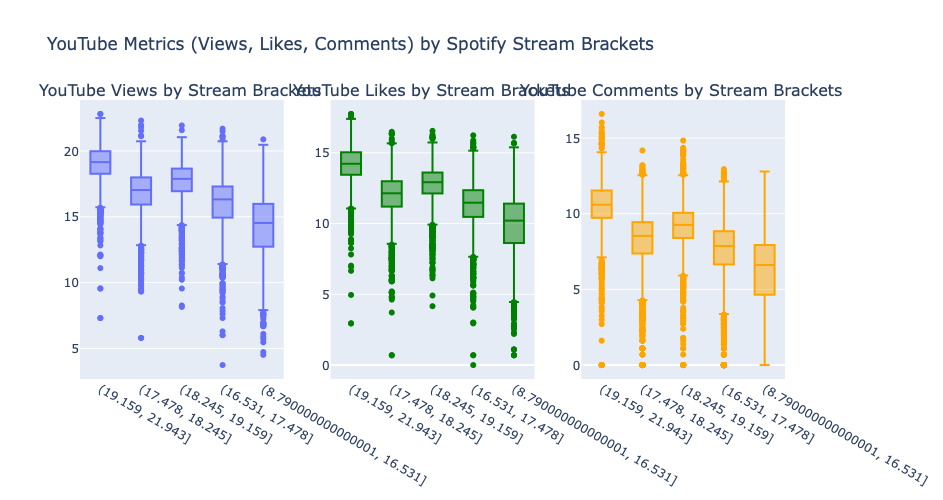

In [12]:

from plotly.subplots import make_subplots

part_one["Stream_bin"] = pd.qcut(part_one["Log_Stream"], q=5)
part_one["Stream_bin"] = part_one["Stream_bin"].astype(str)


fig = make_subplots(rows=1, cols=3, subplot_titles=[
    "YouTube Views by Stream Brackets",
    "YouTube Likes by Stream Brackets",
    "YouTube Comments by Stream Brackets"
])

# Boxplot for Views
fig.add_trace(
    go.Box(x=part_one["Stream_bin"], y=part_one["Log_Views"], name="Views"),
    row=1, col=1
)

# Boxplot for Likes
fig.add_trace(
    go.Box(x=part_one["Stream_bin"], y=part_one["Log_Likes"], name="Likes", marker_color="green"),
    row=1, col=2
)

# Boxplot for Comments
fig.add_trace(
    go.Box(x=part_one["Stream_bin"], y=part_one["Log_Comments"], name="Comments", marker_color="orange"),
    row=1, col=3
)

# Update layout
fig.update_layout(
    height=500, width=1200,
    title_text="YouTube Metrics (Views, Likes, Comments) by Spotify Stream Brackets",
    showlegend=False
)

fig.show()


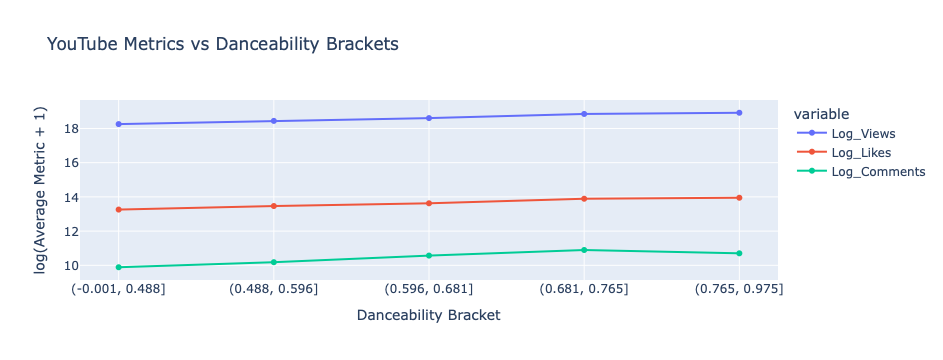

In [13]:

part_one["Dance_bin"] = pd.qcut(part_one["Danceability"], q=5)  # 5 quantile bins
part_one["Dance_bin"] = part_one["Dance_bin"].astype(str)

# Average Views in each bin
bracket_avg = part_one.groupby("Dance_bin").agg({
    "Views": "mean",
    "Likes": "mean",
    "Comments": "mean"
}).reset_index()

# log transform for visualization
bracket_avg["Log_Views"] = np.log1p(bracket_avg["Views"])
bracket_avg["Log_Likes"] = np.log1p(bracket_avg["Likes"])
bracket_avg["Log_Comments"] = np.log1p(bracket_avg["Comments"])

# Line plot
fig = px.line(
    bracket_avg, x="Dance_bin", y=["Log_Views", "Log_Likes", "Log_Comments"],
    markers=True,
    title="YouTube Metrics vs Danceability Brackets",
    labels={"value": "log(Average Metric + 1)", "Dance_bin": "Danceability Bracket"}
)
fig.show()


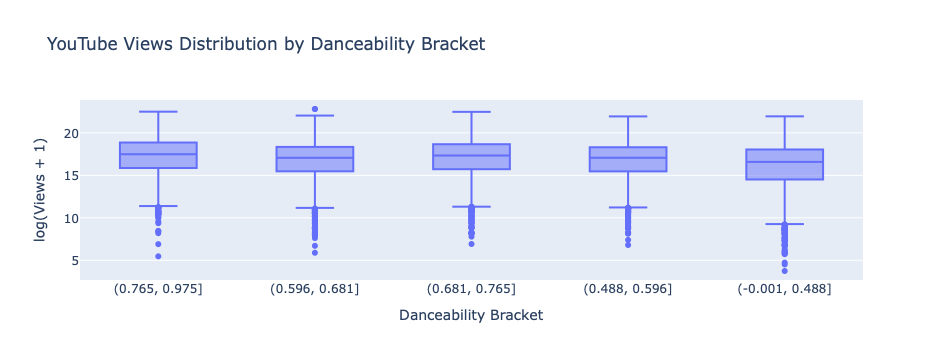

In [14]:
fig = px.box(
    part_one, x="Dance_bin", y="Log_Views",
    title="YouTube Views Distribution by Danceability Bracket",
    labels={"Dance_bin": "Danceability Bracket", "Log_Views": "log(Views + 1)"}
)
fig.show()


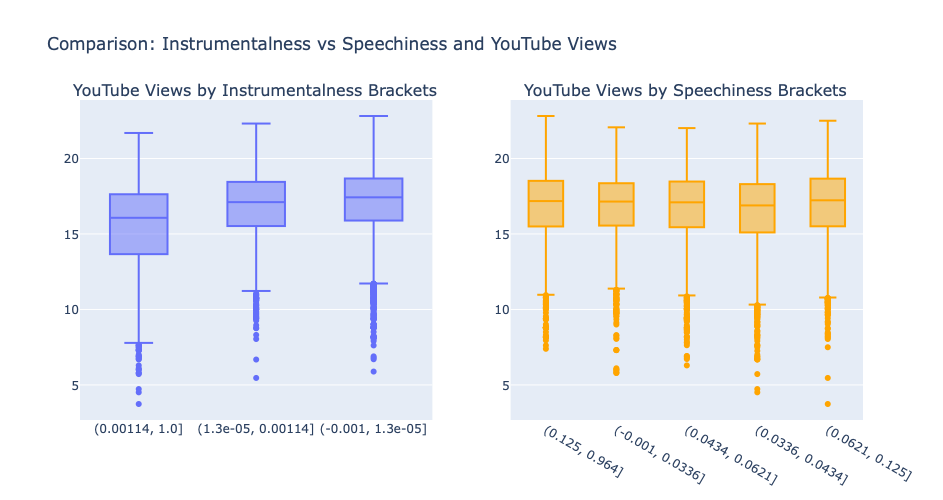

In [19]:

import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd
import numpy as np

# Make sure log columns exist
part_one["Log_Views"] = np.log1p(part_one["Views"])
part_one["Log_Likes"] = np.log1p(part_one["Likes"])
part_one["Log_Comments"] = np.log1p(part_one["Comments"])

# Create bins
part_one["Instr_bin"] = pd.qcut(part_one["Instrumentalness"], q=5, duplicates="drop").astype(str)
part_one["Speech_bin"] = pd.qcut(part_one["Speechiness"], q=5, duplicates="drop").astype(str)

# Subplots: 1 row, 2 columns
fig = make_subplots(rows=1, cols=2, subplot_titles=[
    "YouTube Views by Instrumentalness Brackets",
    "YouTube Views by Speechiness Brackets"
])

# Boxplot for Instrumentalness
fig.add_trace(
    go.Box(x=part_one["Instr_bin"], y=part_one["Log_Views"], name="Instrumentalness"),
    row=1, col=1
)

# Boxplot for Speechiness
fig.add_trace(
    go.Box(x=part_one["Speech_bin"], y=part_one["Log_Views"], name="Speechiness", marker_color="orange"),
    row=1, col=2
)

# Layout
fig.update_layout(
    height=500, width=1000,
    title_text="Comparison: Instrumentalness vs Speechiness and YouTube Views",
    showlegend=False
)

fig.show()


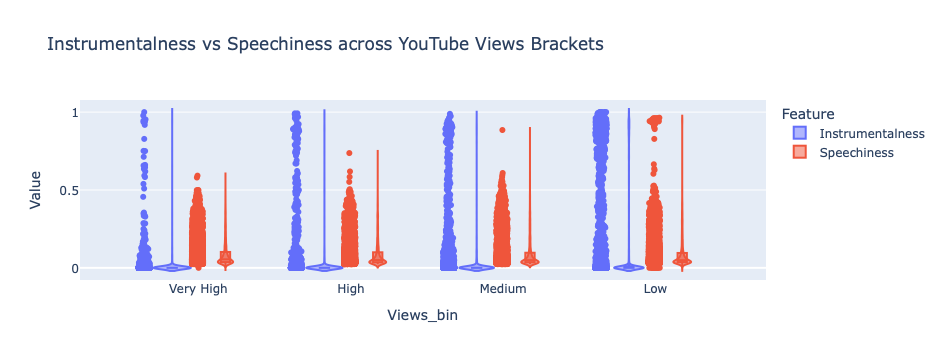

In [22]:
import pandas as pd
import numpy as np
import plotly.express as px

# Make sure log columns exist
part_one["Log_Views"] = np.log1p(part_one["Views"])

# Bin songs by Views (e.g. into 4 groups: low → high)
part_one["Views_bin"] = pd.qcut(part_one["Log_Views"], q=4, labels=["Low", "Medium", "High", "Very High"])

# Boxplot: Instrumentalness by Views group
fig_instr = px.box(
    part_one, x="Views_bin", y="Instrumentalness",
    title="Instrumentalness Distribution by YouTube Views Brackets",
    labels={"Views_bin": "YouTube Views Bracket", "Instrumentalness": "Instrumentalness"}
)


# Boxplot: Speechiness by Views group
fig_speech = px.box(
    part_one, x="Views_bin", y="Speechiness",
    title="Speechiness Distribution by YouTube Views Brackets",
    labels={"Views_bin": "YouTube Views Bracket", "Speechiness": "Speechiness"}
)
melted = part_one.melt(id_vars=["Views_bin"], value_vars=["Instrumentalness", "Speechiness"],
                       var_name="Feature", value_name="Value")

fig = px.violin(
    melted, x="Views_bin", y="Value", color="Feature", box=True, points="all",
    title="Instrumentalness vs Speechiness across YouTube Views Brackets"
)
fig.show()

